# Mointing the Drive to Colab

In [38]:
# Mounting to my drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Question 1


## It contains loading an image and then resizing it to the required dimensions, checking the channels of the image and what kind of information do they hold

In [39]:
import cv2
from google.colab.patches import cv2_imshow
#Loading the image
img = cv2.imread('/content/drive/MyDrive/Random/Images/buck2.jpg')
#Displaying the image
cv2_imshow(img)

Output hidden; open in https://colab.research.google.com to view.

This is the original image. As we can see that it is not 800x800.
Therefore, we will have to resize it to the required size

Width and height of the original image are  1960 and 4032 respectively


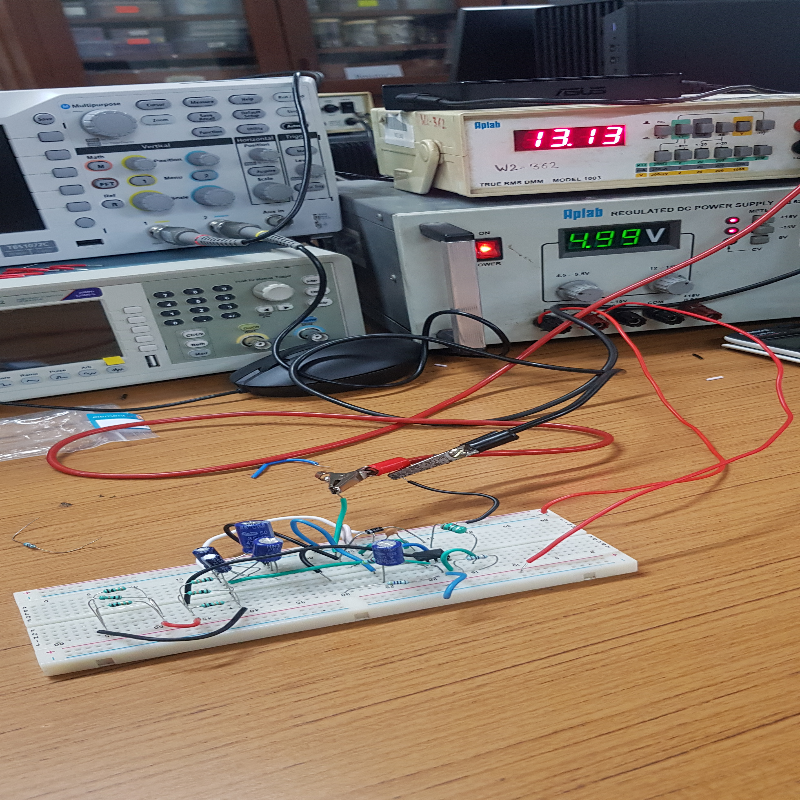

In [40]:
#Now I need to resize the image to 800x800
# Storing the original dimensions
width, height = img.shape[1], img.shape[0]
print('Width and height of the original image are ', width, 'and', height, 'respectively')
#Resizing the image
new_img = cv2.resize(img, (800, 800))
cv2_imshow(new_img)

This is the image after resizing it to 800x800

In [41]:
# Saving the image in .png format
cv2.imwrite('/content/resized_img.png', new_img)

True

In [42]:
# Checking the shape of the image so that we know how many channels there are in this image
new_img.shape

(800, 800, 3)

## Since there are 3 channels lets check what each channel correspond to

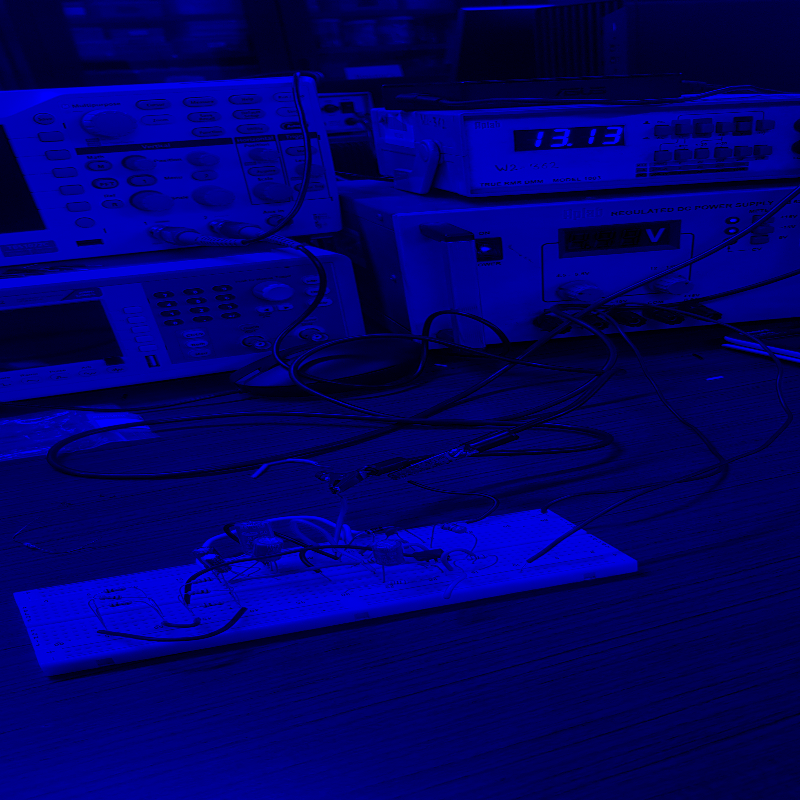

In [43]:
# Reading the stored .png image
img_0 = cv2.imread('/content/resized_img.png')

# Setting the channels to zero
img_0[:, :, 1] = 0
img_0[:, :, 2] = 0
# Displaying the image
cv2_imshow(img_0)

The image above is with only its channel 0 intact that is only blue pixel values are left as we set red and green to be zero

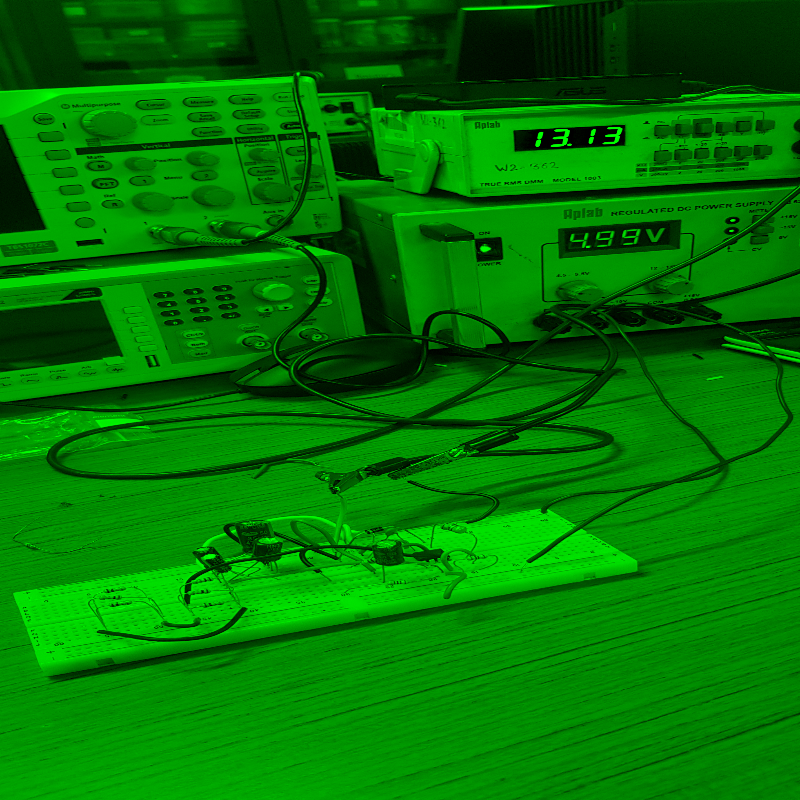

In [44]:
# Reading the image
img_1 = cv2.imread('/content/resized_img.png')
# Editing the channels
img_1[:, :, 0] = 0
img_1[:, :, 2] = 0
#Displaying the image
cv2_imshow(img_1)

Similar to the one above this image contains only green pixel values (channel 1)

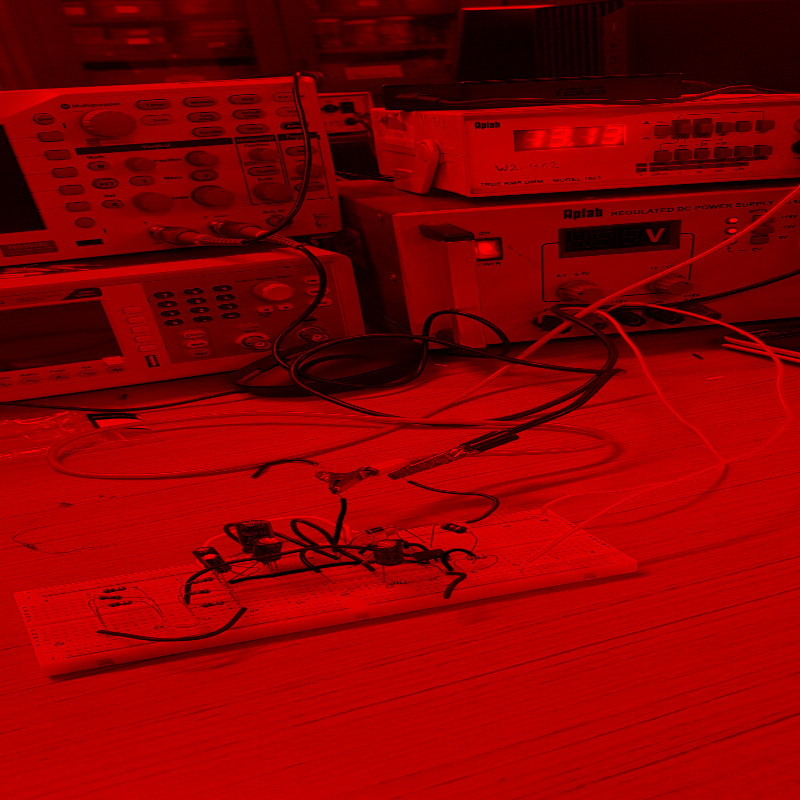

In [45]:
#Reading the image
img_2 = cv2.imread('/content/resized_img.png')
#Editing the channels
img_2[:, :, 0] = 0
img_2[:, :, 1] = 0
#Displaying the image
cv2_imshow(img_2)

For the red scale we obtain this image

## Cropping the image to focus on a part of the image and then scaling that image by a factor of 1.5 and checking the visual difference and how their histograms look like

Not scaled by 1.5


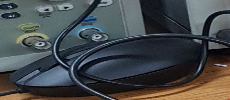

Scaled by 1.5


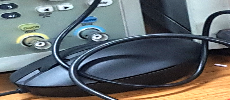

In [46]:
#Trying to crop the mouse from the original image
crop_img = new_img[300:400, 220:450]
#Displaying the cropped img
print("Not scaled by 1.5")
cv2_imshow(crop_img)
#Saving the cropped image
cv2.imwrite('/content/croppedimg.png', crop_img)
#Showing the scaled up image
print('Scaled by 1.5')
cv2_imshow(1.5*crop_img)

As we can see that we can use indexing to crop the image to our needs. For scaling up the intensity of the pixel increases causing the image brightness to increase

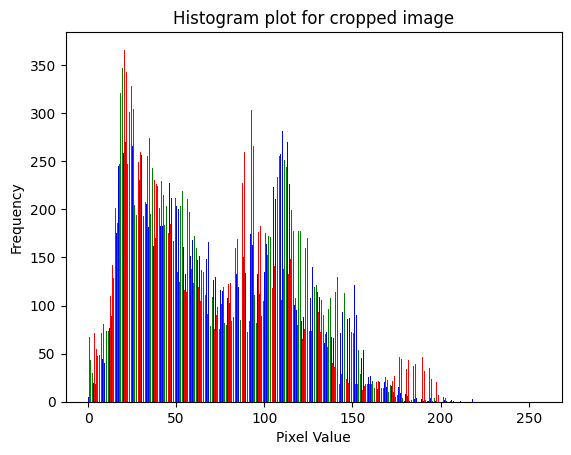

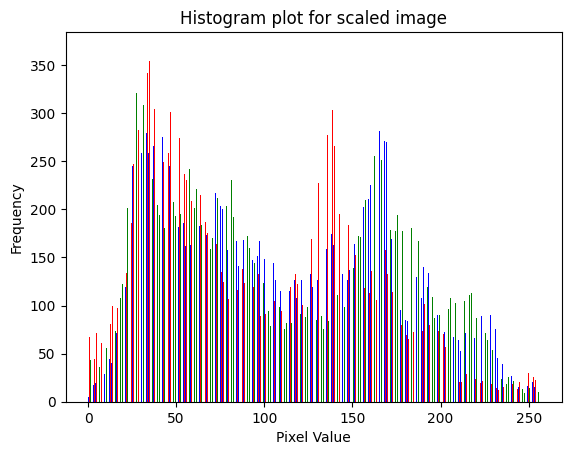

In [47]:
import matplotlib.pyplot as plt
#Splitting the channels for both cropped and the scaled image
cb, cg, cr = cv2.split(crop_img)
b, g, r = cv2.split(crop_img*1.5)
#Plot for the cropped image
plt.hist([cb.ravel(), cg.ravel(), cr.ravel()], 256, [0, 256], color = ['blue', 'green', 'red'])
plt.title("Histogram plot for cropped image")
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()
#Plot for the scaled image
plt.hist([b.ravel(), g.ravel(), r.ravel()], 256, [0, 256], color = ['blue', 'green', 'red'])
plt.title("Histogram plot for scaled image")
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

From the histograms above we can see that scaling up the image causes the histogram to spread that is the intensities of the pixel increases when we scale up the image

## Making a mirror of the image that we have been dealing with so far

Width of the image is 800
Middle point about which the mirroring will happen is 401.0


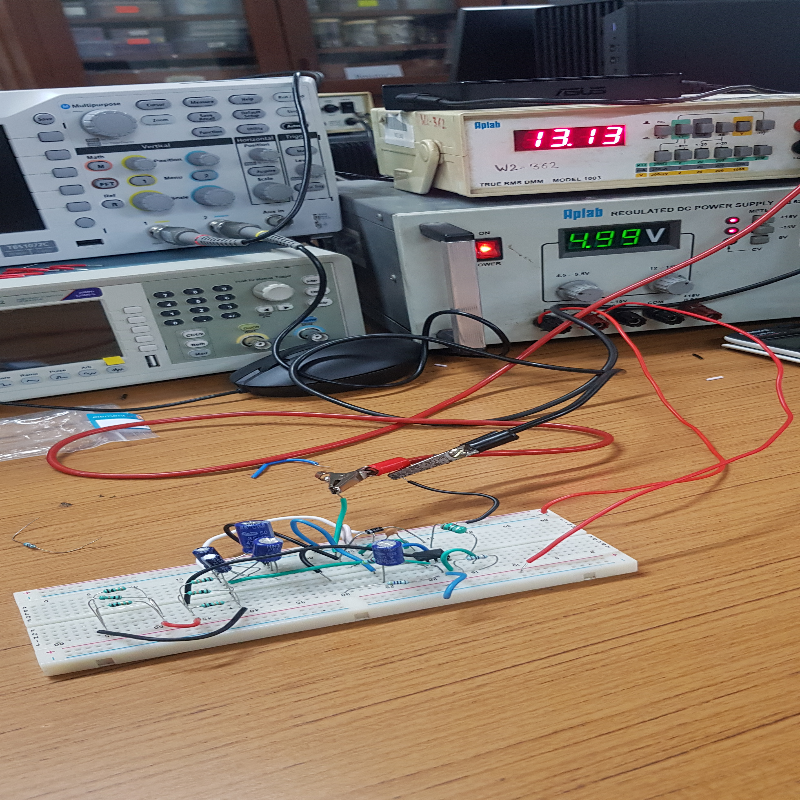

In [48]:
# Loading a seperate image variable
img = cv2.imread('/content/resized_img.png')
l = img.shape[1] # Width of the image

print('Width of the image is', l) # Sanity check
#Finding the middle point
if l % 2 == 0:
  mid = l/2 + 1
else:
  mid = (l+1)/2

print('Middle point about which the mirroring will happen is', mid) #Sanity check
mir_img = img
# Mirroring about the middle point
for i in range(int(mid)):
  mir_img[:, i] = img[:, l - i - 1]
# Displaing the original image
cv2_imshow(new_img)

The image above is added for comparing as this is the image which we will be mirroring

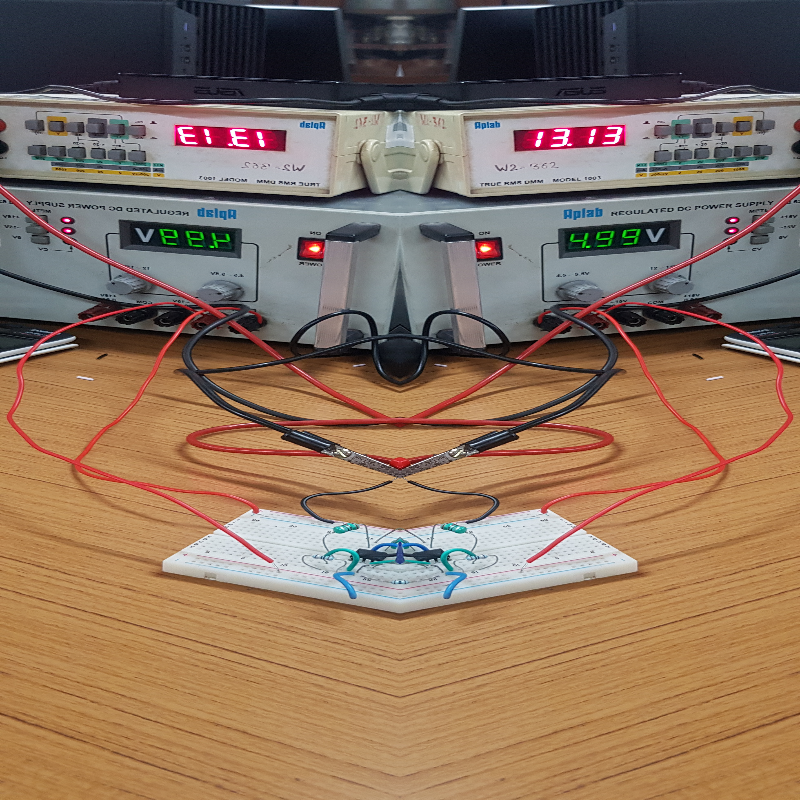

In [49]:
cv2_imshow(mir_img) #Mirrored image

We can see that this image is mirrored about the centre

# Question 2

## Take a night time photo from your camera and then convert it to grayscale then plot its histogram and commulative histogram while dispalying the image

In [50]:
night_img = cv2.imread('/content/drive/MyDrive/Random/Images/Chayoos.jpg') # Reading the image
cv2.imwrite('/content/Chayoos.png', night_img) # Saving it in .png format
night_img = cv2.imread('/content/Chayoos.png')# Reading the save to keep the original image untouched
gray_img = cv2.cvtColor(night_img, cv2.COLOR_BGR2GRAY)
# Here cv2.cvtColor is used to change the color of the image and cv2.COLOR_BGR2GRAY
#is the flag which makes the image gray scaled
cv2_imshow(night_img)
print(night_img.shape)

Output hidden; open in https://colab.research.google.com to view.

This is the original image taken by the camera. We will be using image processing on it from this point.

## Converting the image to grayscale and resizing to 800x800

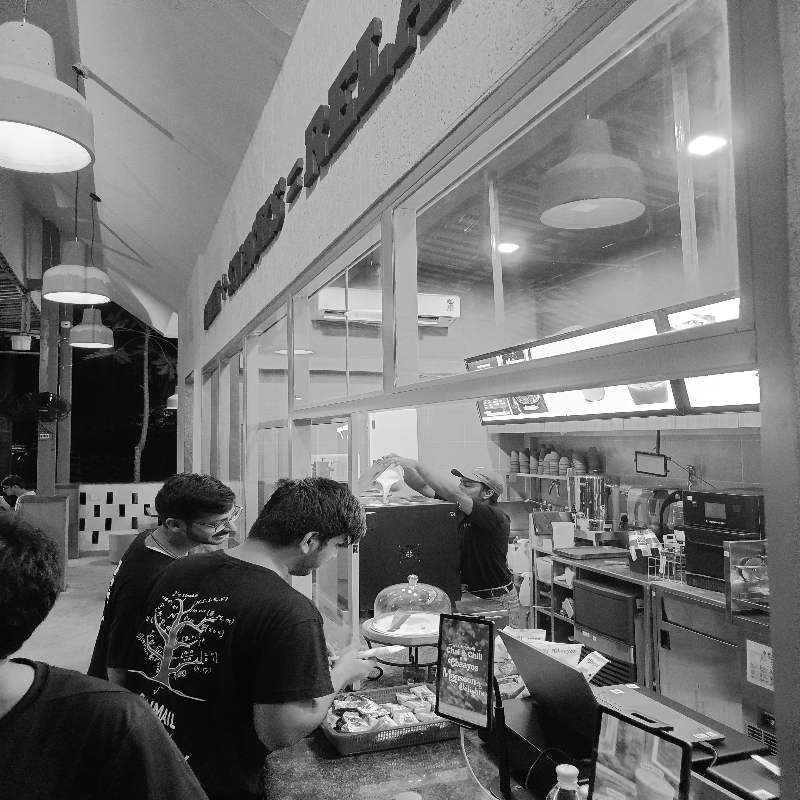

In [51]:
gray_img = cv2.resize(gray_img, (800, 800)) # resizing the image
cv2_imshow(gray_img) # Displaying the grayscaled image

This is the image with grayscale

## Plotting the grayscale image's histograms

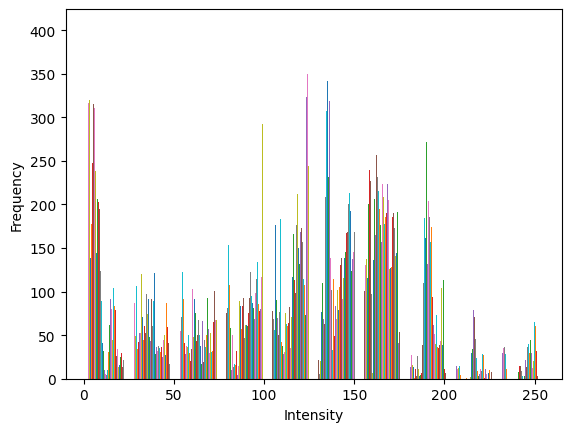

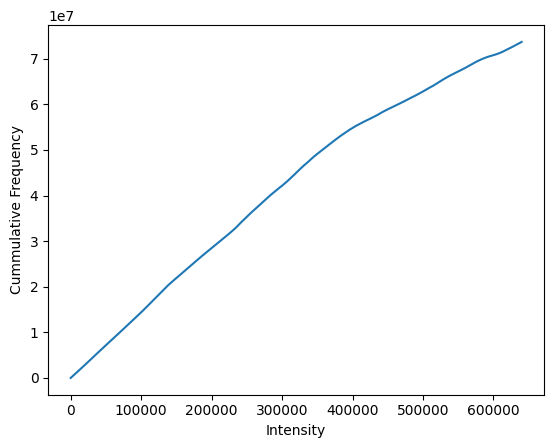

In [52]:
import numpy as np
# Creating its histogram and cummulative histogram
plt.hist(gray_img)
plt.xlabel('Intensity')
plt.ylabel('Frequency')
plt.show()
cumhist = np.cumsum(gray_img)
plt.plot(cumhist)
plt.xlabel('Intensity')
plt.ylabel('Cummulative Frequency')
plt.show()

## Scaling the image for better visibility

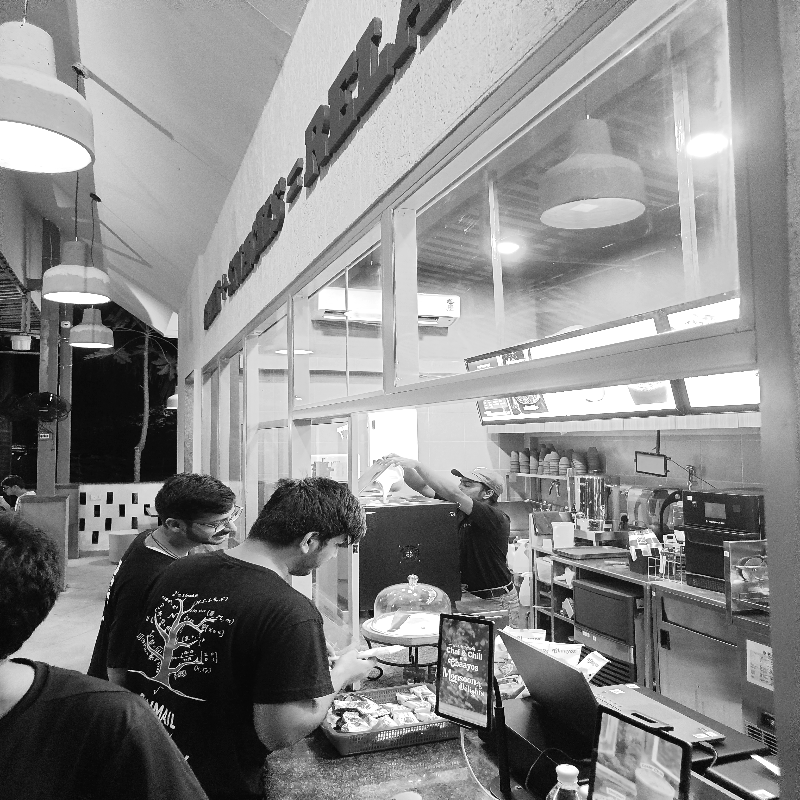

In [53]:
# Scaling the image
scaled_img = gray_img*1.2
cv2_imshow(scaled_img)

Here since my image itself was well lit we can see that there is no need to scale it by a lot. But for even more dark night photos increasing the brightness can let us examine the image further to make a better decision of which transformation would suit the image best.

## Applying min-max auto-audjustment which was discussed in the class

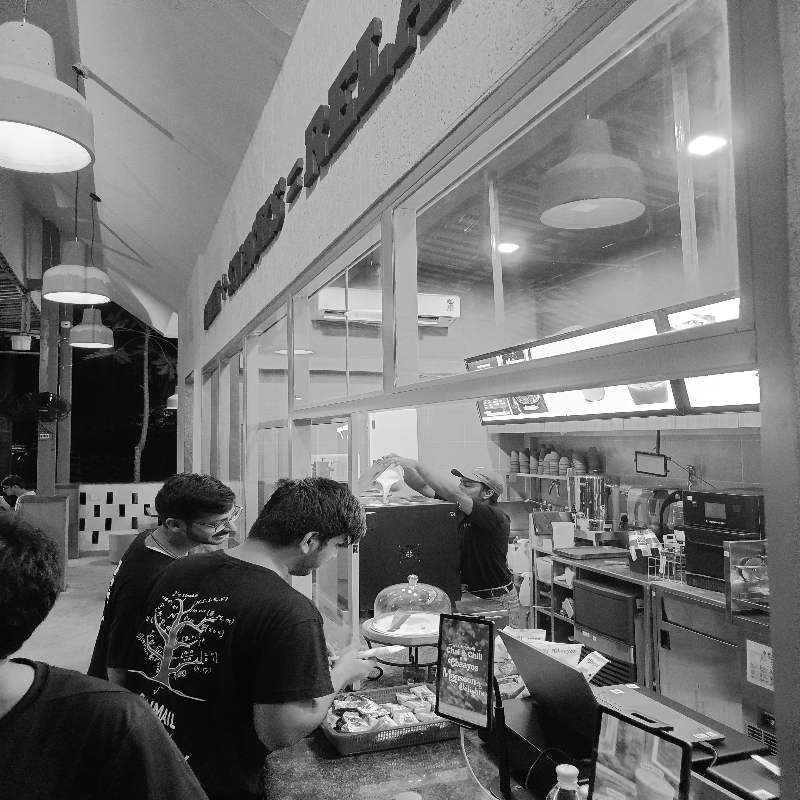

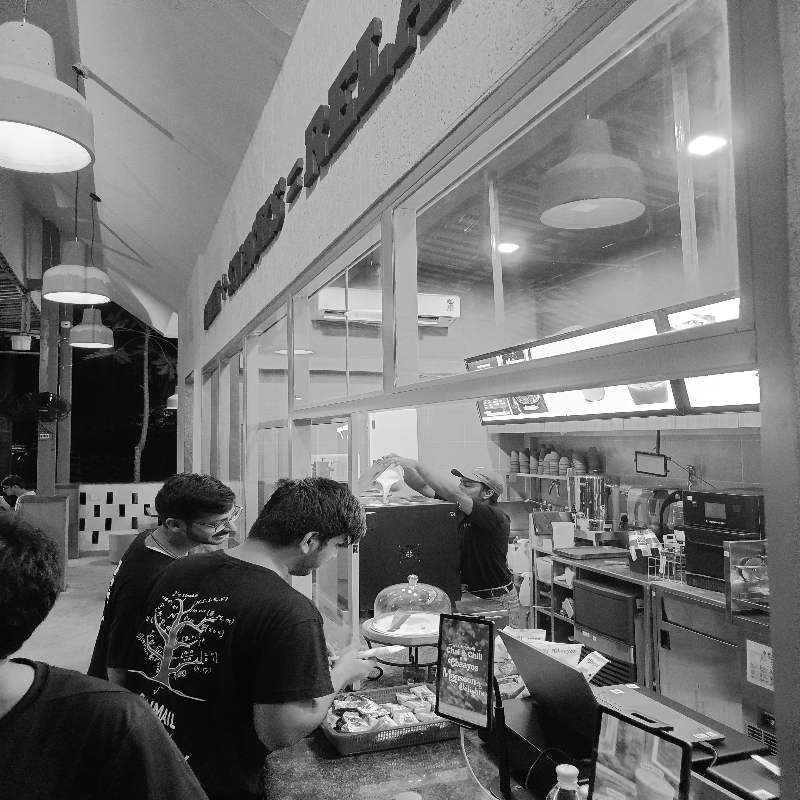

In [54]:
max_in = np.max(gray_img)
min_in = np.min(gray_img)

alpha = 255 / (max_in - min_in)
beta = -min_in * alpha

adjusted_img = gray_img[:,:] * alpha + beta

cv2_imshow(adjusted_img)
cv2_imshow(gray_img)


Here we can see that the first image is more clear as all the intensities are being mapped to 0 - 255 intensity value.

## Using CV2 equalizer function to equalize the image

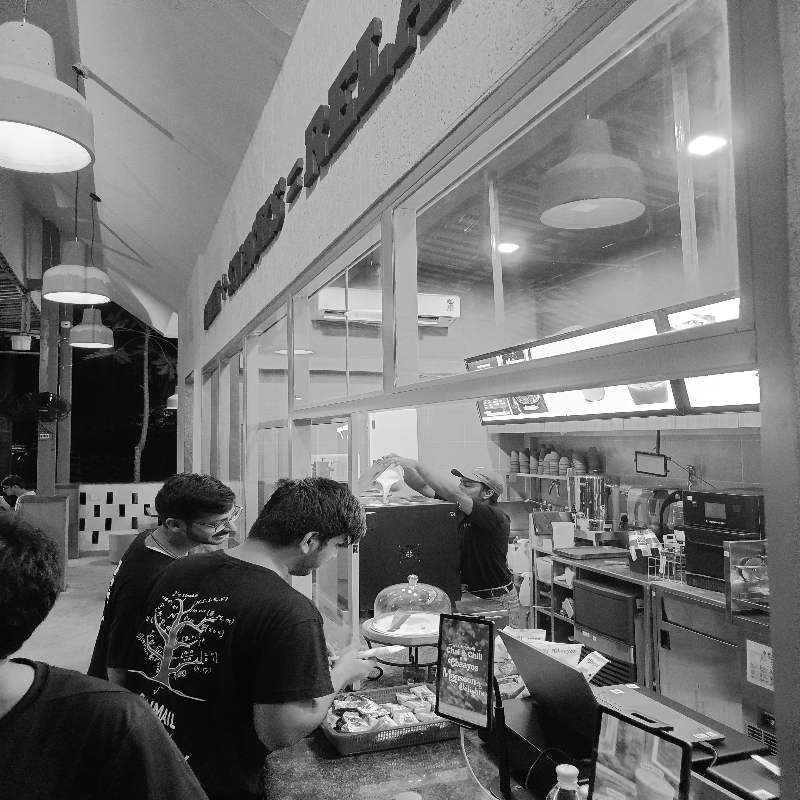

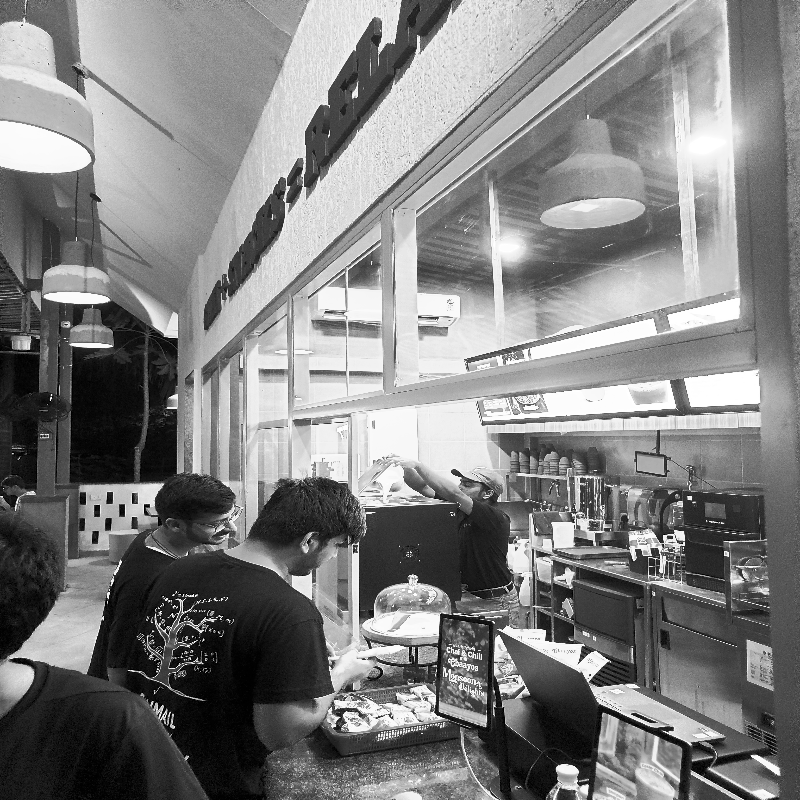

In [55]:
# To equalize the histogram we use the function from cv2 to do that same

img_eq = cv2.equalizeHist(gray_img)
cv2_imshow(gray_img)
cv2_imshow(img_eq)

By equalizing the image we observe that there are regions which have become oversaturated. While some other parts have more contrast. This enhances the image but we will have to do further processing to achieve a better output

## Plotting the equalized image's histogram and its cummulative sum

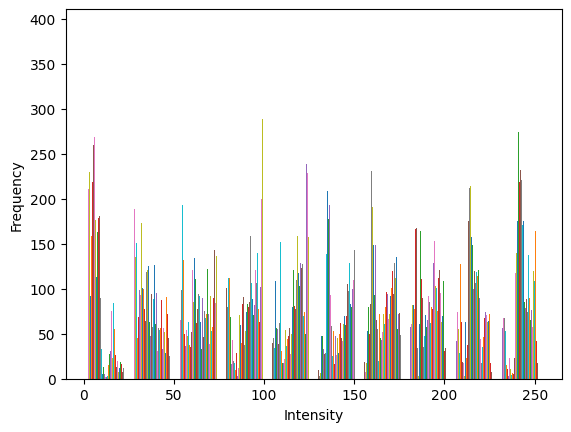

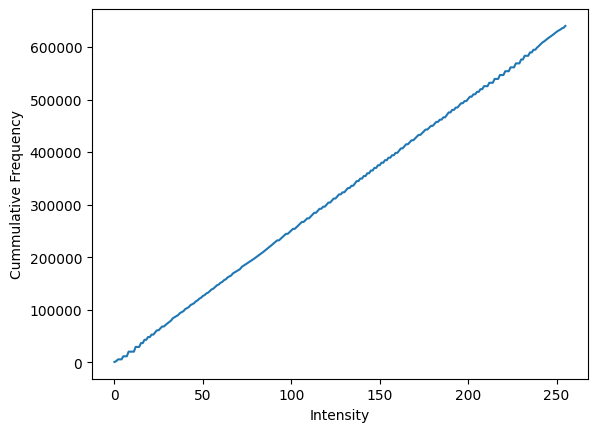

In [56]:
#Plotting the histograms
# hist = cv2.calcHist([img_eq], [0], None, [256], [0, 256])
plt.hist(img_eq)
plt.xlabel('Intensity')
plt.ylabel('Frequency')
plt.show()
cumhist = np.cumsum(hist)
plt.plot(cumhist)
plt.xlabel('Intensity')
plt.ylabel('Cummulative Frequency')
plt.show()

From the histograms we can see that it's almost linear and uniform distribution. Therefore getting a target histogram distribution from this would be easier compared to before.

Here, I have tried to keep the middle tone values to hold more influene causing somewhat gaussian distribution to occur in the curve

## Choosing a reference image and displaying its attributes

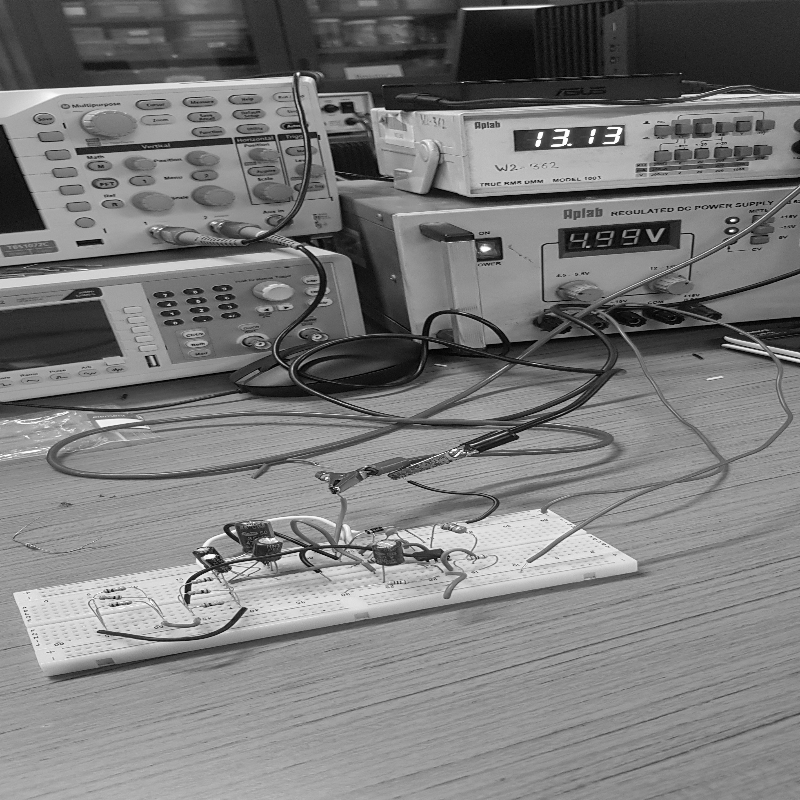

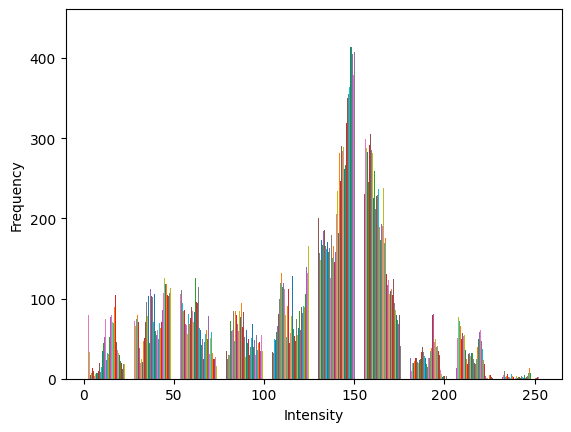

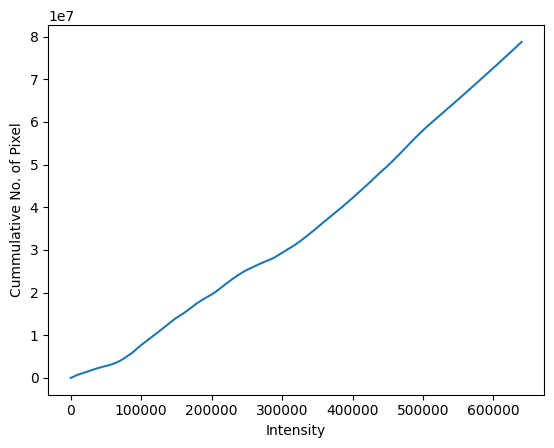

In [57]:
#First we will convert it to gray scale
gray_ref = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_ref)

#Displaying the reference histogram
plt.hist(gray_ref)
plt.xlabel('Intensity')
plt.ylabel('Frequency')
plt.show()

plt.plot(np.cumsum(gray_ref))
plt.xlabel('Intensity')
plt.ylabel('Cummulative No. of Pixel')
plt.show()

## Matching the image with the reference image and showing the final plots

<ipython-input-58-4b60fbd9b8df>:6: FutureWarning: `multichannel` is a deprecated argument name for `match_histograms`. It will be removed in version 1.0. Please use `channel_axis` instead.
  matched = exposure.match_histograms(img_eq, gray_ref, multichannel=False)


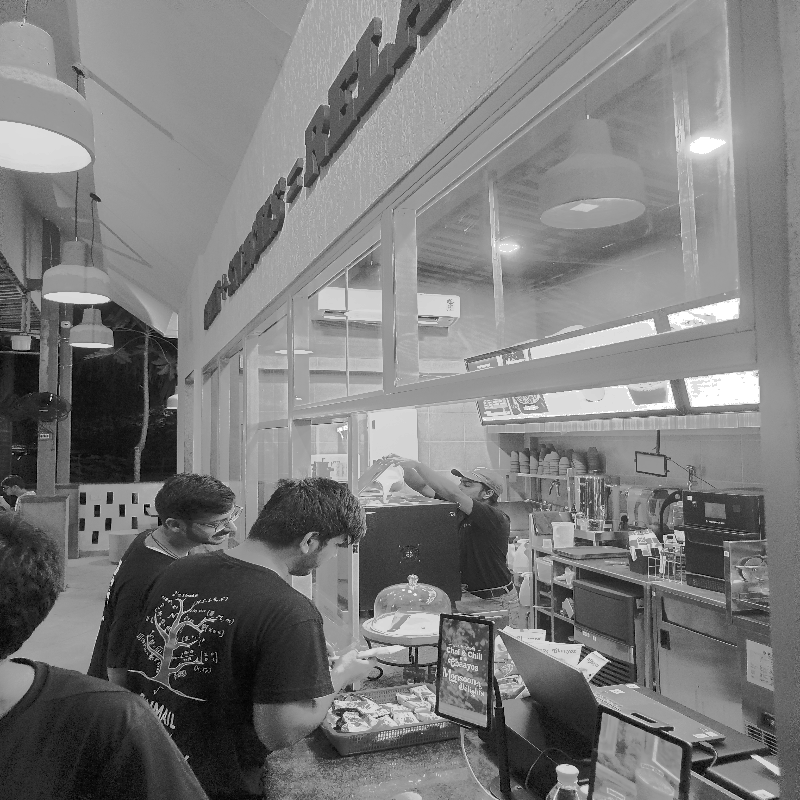

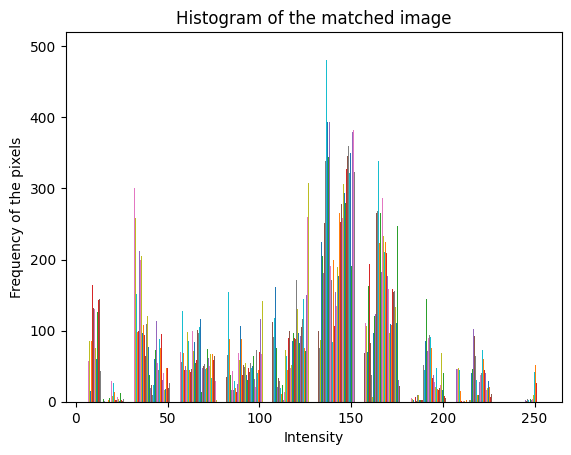

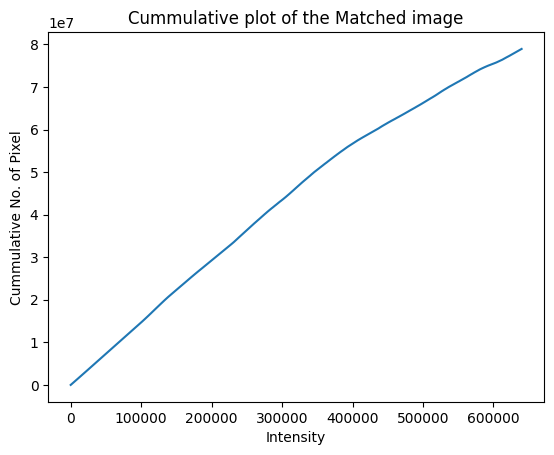

In [58]:
# We will use the histogram of the first image to as the reference image for a histogram
# Importing exposure to match the cummulative histogram of one image with the other
from skimage import exposure

# Now we will use this image as a match for our equalized image
matched = exposure.match_histograms(img_eq, gray_ref, multichannel=False)
# show the output image
cv2_imshow(matched)
plt.hist(matched)
plt.title('Histogram of the matched image')
plt.xlabel('Intensity')
plt.ylabel('Frequency of the pixels')
plt.show()

plt.plot(np.cumsum(matched))
plt.title('Cummulative plot of the Matched image')
plt.xlabel('Intensity')
plt.ylabel('Cummulative No. of Pixel')
plt.show()

We can see that the new matched image has a histogram which is heavily inspired by the reference images histogram. So we can refer to any image which we find has useful/target histogram and use it for our equalized image.

# References:

[1] [OpenCV-Imshow on Colab](https://stackoverflow.com/questions/57090598/using-cv2-imshow-in-google-colab)

[2] [OpenCV-Histogram-Equalization](https://docs.opencv.org/3.4/d4/d1b/tutorial_histogram_equalization.html#:~:text=What%20is%20Histogram%20Equalization%3F,the%20available%20range%20of%20intensities.)

[3] [Histogram Matching](https://pyimagesearch.com/2021/02/08/histogram-matching-with-opencv-scikit-image-and-python/)